#Stage 1   
VIP CUP   
______
**SPA Group**  
Sajjad Jabbarzade   
Parham Soltani   
Amirtaha Aghasi
______   

##Libraries

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

##Preparing Data   
Importing the images from file folder into the Google VM Drive

In [2]:
from google.colab import files

In [3]:
uploaded = files.upload()

Saving Desk.png to Desk.png
Saving Hudson.jpg to Hudson.jpg
Saving Jakob.jpg to Jakob.jpg
Saving John.png to John.png
Saving Kevin.png to Kevin.png


##Functions

###Saving the Images

In [4]:
def save(image):
  name = input("The name of Image: ")
  formatsave = input("Format for save (png, jpg, jpeg): ")
  cv2.imwrite(name+"."+formatsave, image)

In [5]:
def saveall(list_image):
  formatsave = input("Format for save (png, jpg, jpeg): ")
  for idx in range(len(list_image)):
    cv2.imwrite("Idx "+str(idx)+"."+formatsave, list_image[idx])

###Enhancing the Quality of Images.

In [6]:
def enhance(input, viewout=True, outret=True, saved=False):
  if len(input.shape) == 2:
    normalized_img = cv2.normalize(input, None, 0, 255, cv2.NORM_MINMAX)
    blurred = cv2.GaussianBlur(normalized_img, (5, 5), 0)
    _, enhanced_image = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    median_filtered = cv2.medianBlur(enhanced_image, 5)
    alpha = 1.5 # Contrast control (1.0-3.0)
    beta = 0 # Brightness control (0-100)
    contrast_enhanced = cv2.convertScaleAbs(input, alpha=alpha, beta=beta)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened_image = cv2.filter2D(contrast_enhanced, -1, kernel)
    if viewout == True:
      cv2_imshow(enhanced_image)
      cv2_imshow(median_filtered)
      cv2_imshow(contrast_enhanced)
      cv2_imshow(sharpened_image)
    if saved == True:
      savelist = [normalized_img, enhanced_image, median_filtered, contrast_enhanced, sharpened_image]
      saveall(savelist)
    if outret == True: return normalized_img, enhanced_image, median_filtered, contrast_enhanced, sharpened_image
  if len(input.shape) == 3:
    alpha = 1.5 # Contrast control (1.0-3.0)
    beta = 0 # Brightness control (0-100)
    contrast_enhanced = cv2.convertScaleAbs(input, alpha=alpha, beta=beta)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened_image = cv2.filter2D(contrast_enhanced, -1, kernel)
    if viewout == True:
      cv2_imshow(contrast_enhanced)
      cv2_imshow(sharpened_image)
    if saved == True:
      savelist = [contrast_enhanced, sharpened_image]
      saveall(savelist)
    if outret == True: return contrast_enhanced, sharpened_image

###Recognizing Murderer's Fingerprint

In [7]:
def DefectID(GOOD_MATCH_SCORE, NUM_GOOD_MATCH, list_of_image):
  IDG = np.argmax(GOOD_MATCH_SCORE)
  IDN = np.argmax(NUM_GOOD_MATCH)
  if IDG==IDN: createout(IDG, list_of_image[IDG])
  else: print("Please Set another MAX_NUM_FEATURES and Run All Again!")

In [8]:
def createout(idxmurderer, image):
  imagetext = image.copy()
  IDDic = {0: "Hudson",
           1: "Jakob",
           2: "John",
           3: "Kevin"}
  text = "PERPETRATOR: "+IDDic[idxmurderer]
  fontScale = 2
  fontFace = cv2.FONT_HERSHEY_PLAIN
  fontColor = (255,0,0)
  thickness = 3
  cv2.putText(imagetext,text,(25,25),fontFace,fontScale,fontColor,thickness,8)
  plt.imshow(imagetext)
  cv2.imwrite("Output.png", imagetext[:,:,::-1])

##Task 3

###Images

In [28]:
from google.colab.patches import cv2_imshow
# To show an image with the real size. In Colab, the command cv2.imshow has not defined.

In [29]:
finger = list()
finger = [cv2.imread("/content/Hudson.jpg", 1),
          cv2.imread("/content/Jakob.jpg", 1),
          cv2.imread("/content/John.png", 1),
          cv2.imread("/content/Kevin.png", 1)]
# We added white background to fourth (Kevin.png) picture because it coudn't be read by OpenCV.

In [30]:
finger_gray = list()
finger_gray = [cv2.imread("/content/Hudson.jpg", 0),
               cv2.imread("/content/Jakob.jpg", 0),
               cv2.imread("/content/John.png", 0),
               cv2.imread("/content/Kevin.png", 0)]

In [31]:
for idx in range(len(finger)):
  print(finger[idx].shape)

(612, 409, 3)
(955, 1023, 3)
(1395, 947, 3)
(277, 228, 3)


In [32]:
desk = cv2.imread("/content/Desk.png")
desk_gray = cv2.cvtColor(desk, cv2.COLOR_BGR2GRAY)

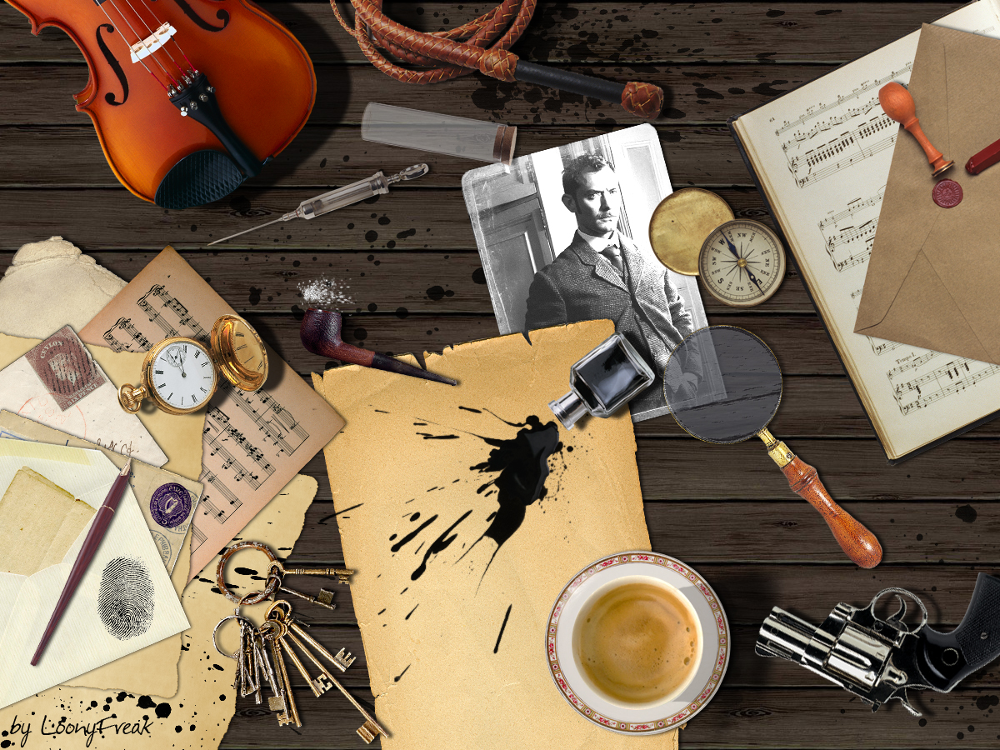

In [33]:
cv2_imshow(desk)

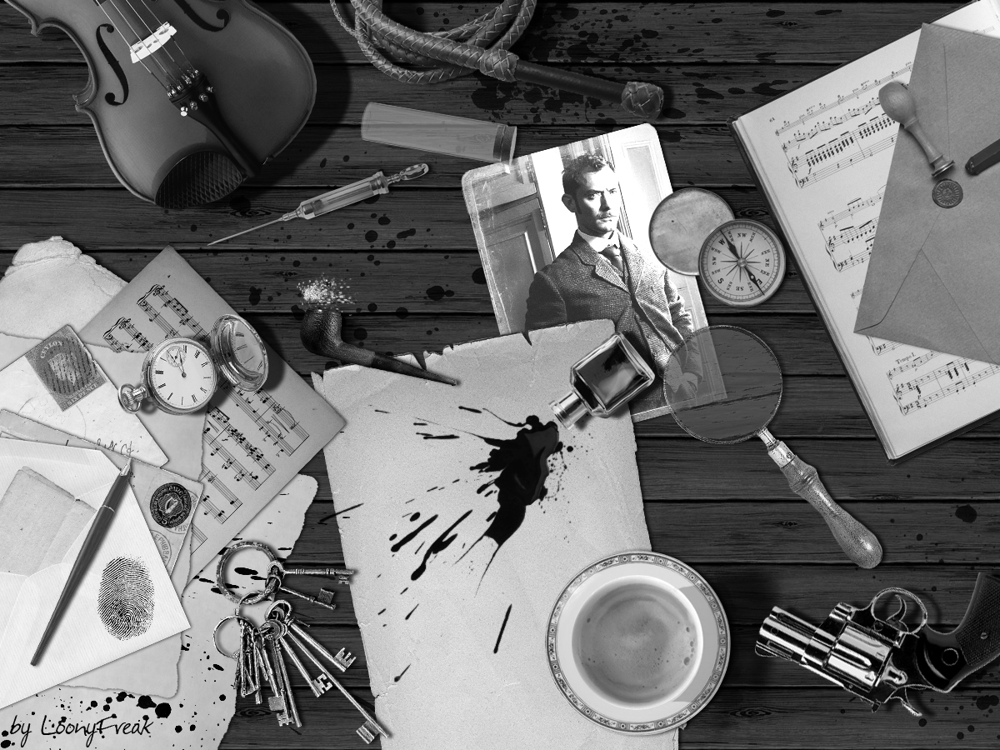

In [34]:
cv2_imshow(desk_gray)

###Enhance

####Desk

In [35]:
_, sharpdesk = enhance(desk, outret=True, viewout=False, saved=False)

In [36]:
sharpdesk_crop = sharpdesk[665:770, 110:190]

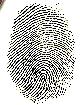

In [37]:
cv2_imshow(sharpdesk_crop)

In [38]:
sharpdesk_crop.shape

(105, 80, 3)

In [39]:
sharpdesk_cropresized = cv2.resize(sharpdesk_crop, (450, 600), interpolation = cv2.INTER_CUBIC)

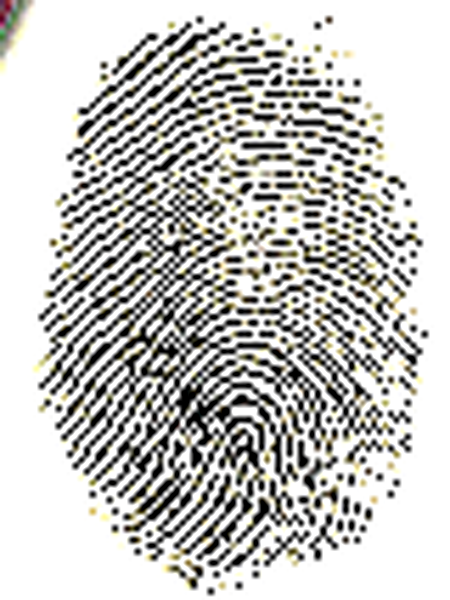

In [40]:
cv2_imshow(sharpdesk_cropresized)

####Fingerprints

In [41]:
sharpfig = []
for idx in range(len(finger)):
  _, sharpfig_step = enhance(finger[idx], outret=True, viewout=False, saved=False)
  sharpfig.append(sharpfig_step)

In [42]:
len(sharpfig)

4

In [43]:
sharpfig[0].shape

(612, 409, 3)

###Algorithm

In [44]:
imageforalg1 = cv2.cvtColor(sharpdesk_cropresized, cv2.COLOR_BGR2RGB)
imageforalg1_gray = cv2.cvtColor(sharpdesk_cropresized, cv2.COLOR_BGR2GRAY)

In [45]:
NUM_GOOD_MATCH = []
GOOD_MATCH_SCORE = []

len all matches: 250
avg: 84.224
max: 98.0
min: 50.0
len good matches: 60
len all matches: 250
avg: 83.36
max: 107.0
min: 50.0
len good matches: 51
len all matches: 250
avg: 86.008
max: 105.0
min: 54.0
len good matches: 51
len all matches: 250
avg: 86.82
max: 102.0
min: 49.0
len good matches: 58


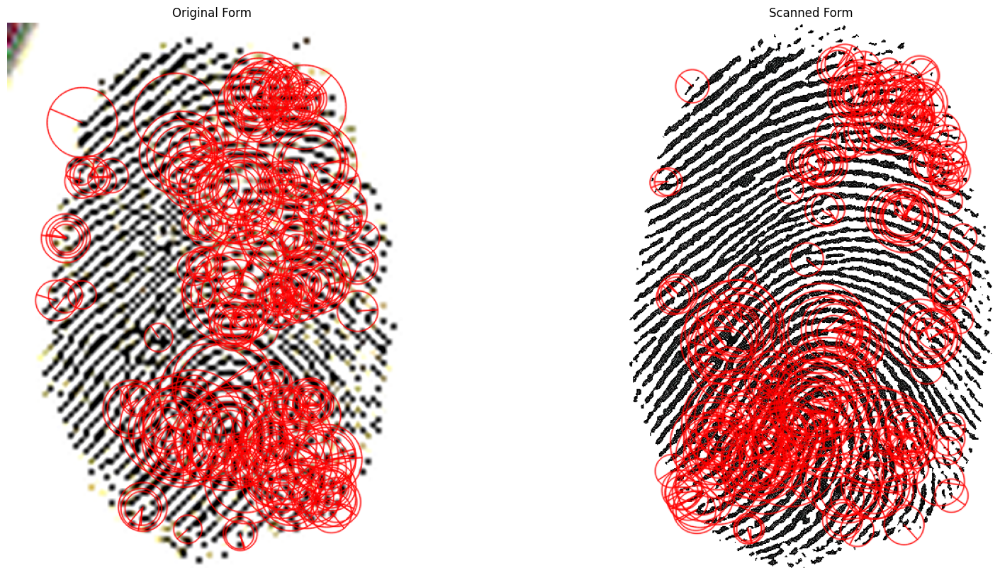

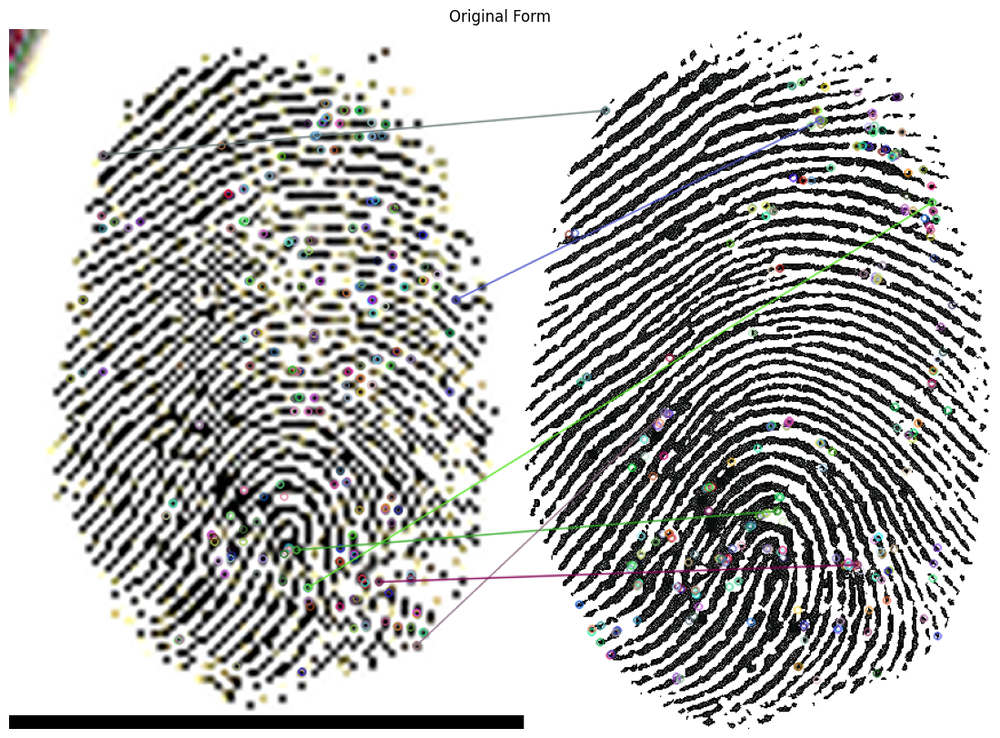

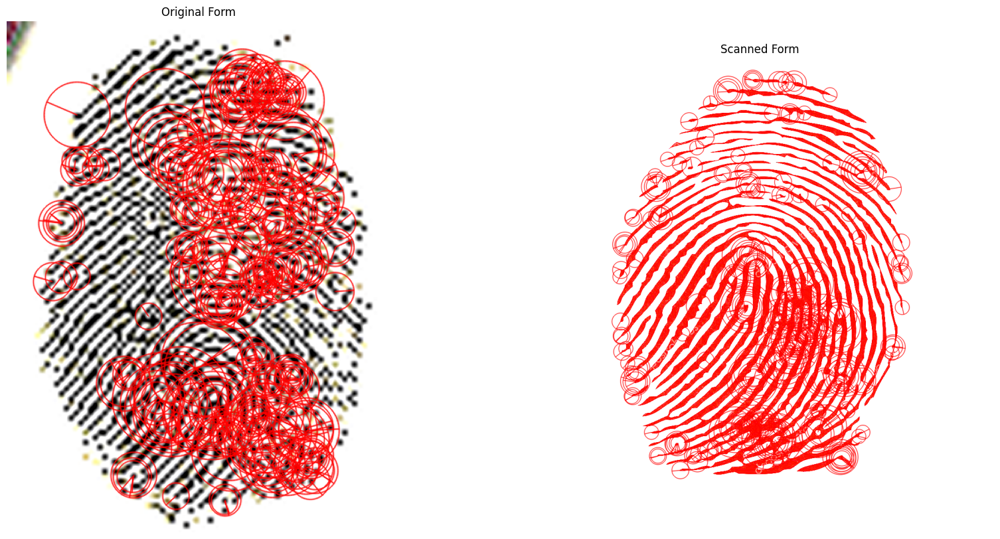

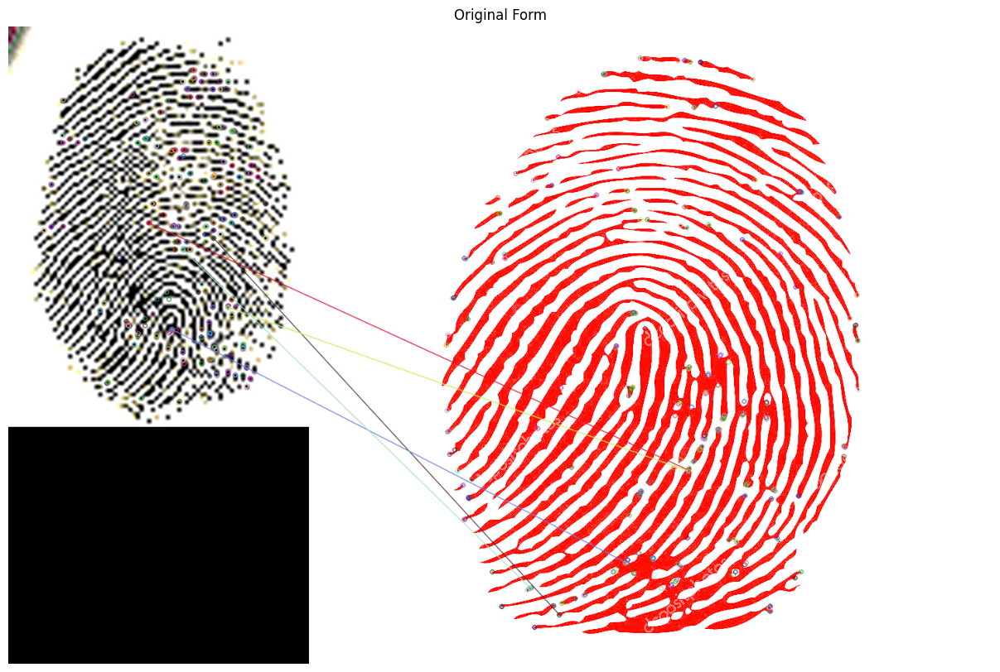

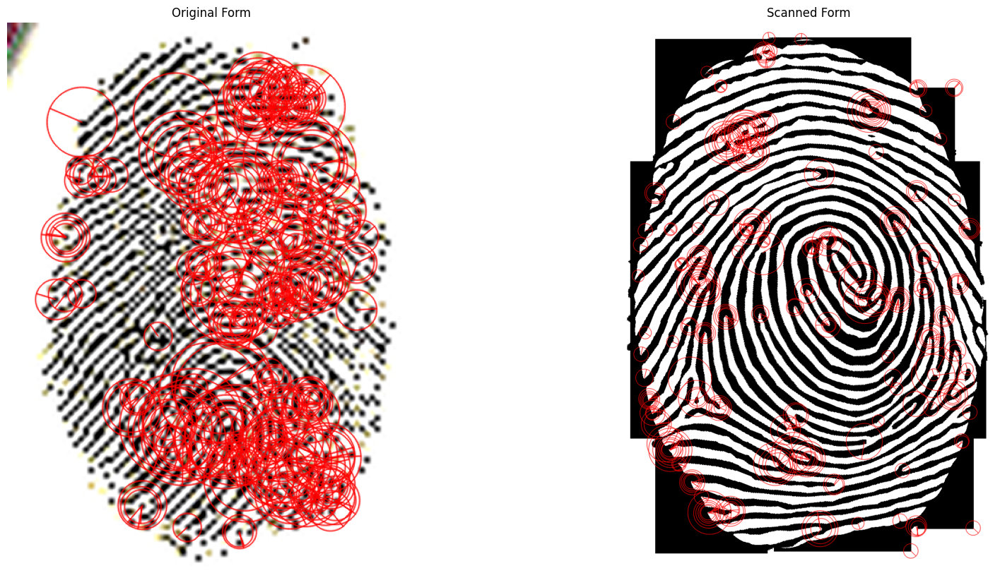

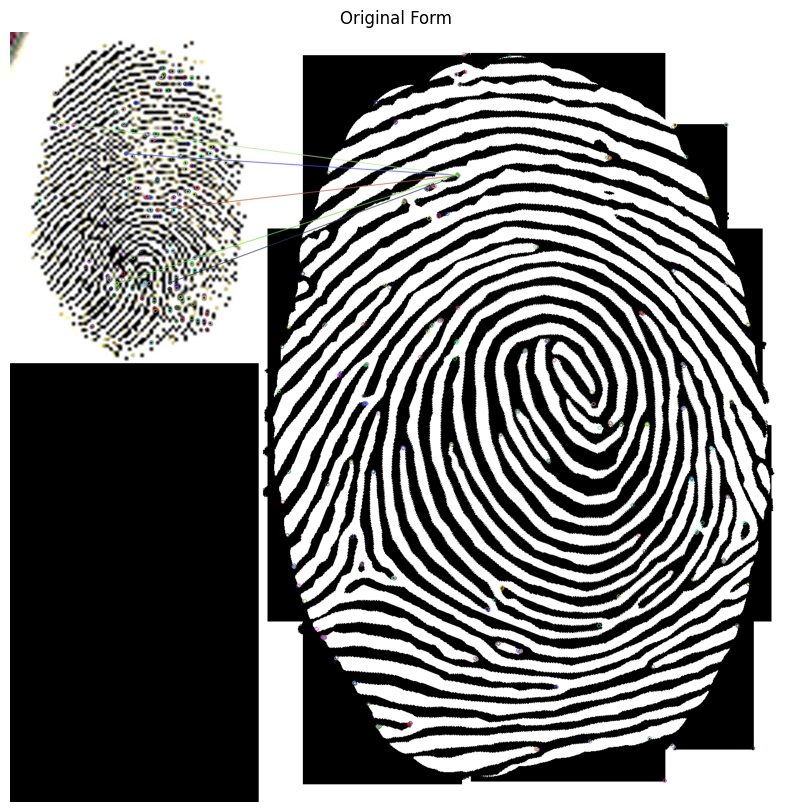

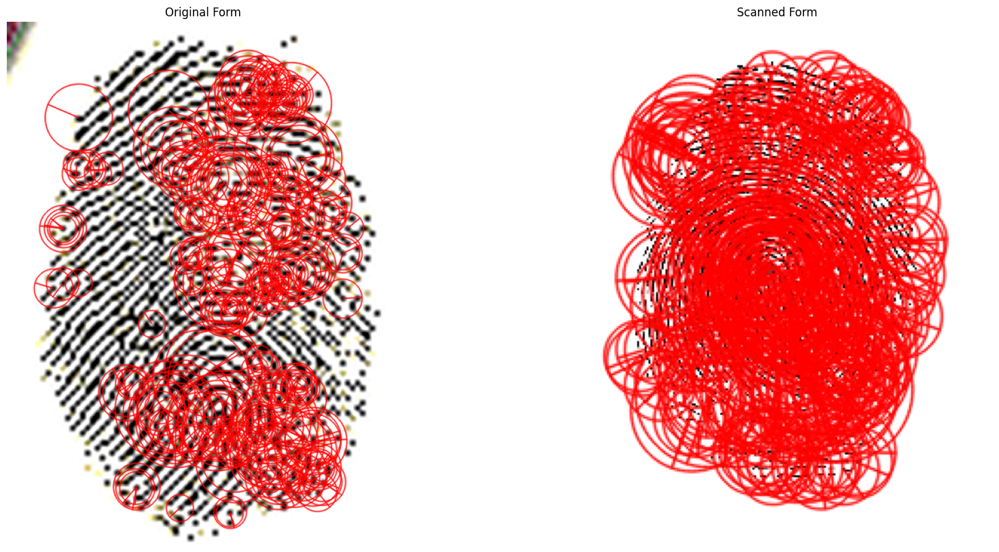

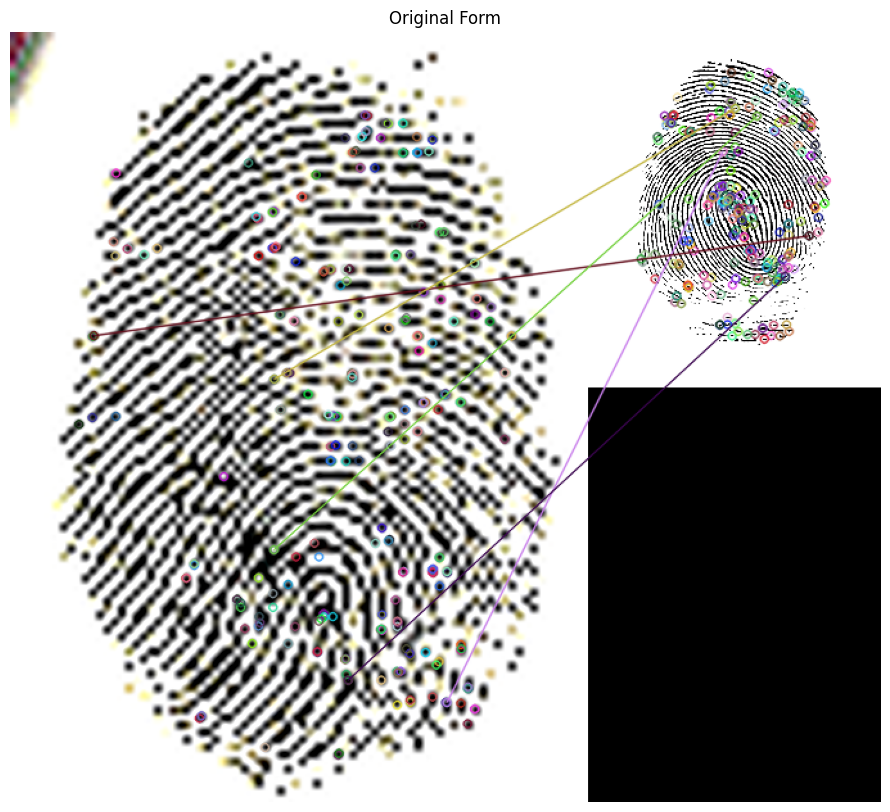

In [46]:
for idx in range(len(sharpfig)):
  im1 = imageforalg1
  im2 = cv2.cvtColor(sharpfig[idx], cv2.COLOR_BGR2RGB)
  im1_gray = imageforalg1_gray
  im2_gray = cv2.cvtColor(sharpfig[idx], cv2.COLOR_BGR2GRAY)

  MAX_NUM_FEATURES = 250

  orb = cv2.ORB_create(MAX_NUM_FEATURES)
  keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
  keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)

  im1_display = cv2.drawKeypoints(im1, keypoints1, outImage=np.array([]),
                                  color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  im2_display = cv2.drawKeypoints(im2, keypoints2, outImage=np.array([]),
                                  color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  plt.figure(figsize=[20,10])
  plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Original Form");
  plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned Form");

  matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)

  matches = matcher.match(descriptors1, descriptors2, None)
  matches = list(matches)
  print("len all matches:",len(matches))
  meann= sum([x.distance for x in matches]) / len(matches)
  print("avg:",meann)
  print("max:",max(matches, key=lambda item: item.distance).distance)
  print("min:",min(matches, key=lambda item: item.distance).distance)
  radius_threshold = meann
  matches = matcher.radiusMatch(descriptors1, descriptors2,maxDistance=radius_threshold)
  matches = [m[0] for m in matches if len(m) == 1]

  matches = list(matches)
  print("len good matches:",len(matches))
  GOOD_MATCH_SCORE.append(len(matches))
  matches.sort(key=lambda x: x.distance, reverse=False)

  numGoodMatches = int(len(matches)*0.1)
  matches = matches[:numGoodMatches]

  NUM_GOOD_MATCH.append(numGoodMatches)

  im_matches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)

  plt.figure(figsize=[40, 10])
  plt.imshow(im_matches);plt.axis("off");plt.title("Original Form")

  points1 = np.zeros((len(matches), 2), dtype=np.float32)
  points2 = np.zeros((len(matches), 2), dtype=np.float32)

  for i, match in enumerate(matches):
      points1[i, :] = keypoints1[match.queryIdx].pt
      points2[i, :] = keypoints2[match.trainIdx].pt

###Extract the Perpetrator

In [47]:
NUM_GOOD_MATCH

[6, 5, 5, 5]

In [48]:
GOOD_MATCH_SCORE

[60, 51, 51, 58]

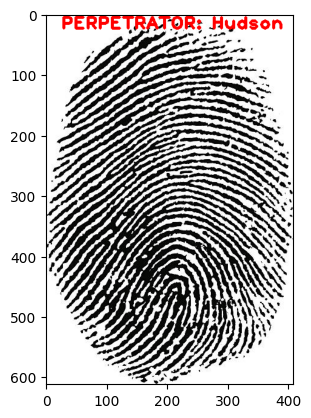

In [49]:
DefectID(GOOD_MATCH_SCORE, NUM_GOOD_MATCH, finger)